In [1]:
import sys
sys.path.append('../..')

import os
import numpy as np
import scipy
import tensorflow as tf
import soundfile as sf

import functools

from matplotlib import pyplot as plt
fig_size = [0,0]
fig_size[0] = 5
fig_size[1] = 4
plt.rcParams["figure.figsize"] = fig_size

import IPython
from IPython.display import Audio

from src.features.spectral_features import stft, istft
from src.utils.bss_eval import bss_eval_sources

### Load a sample file

In [2]:
mix_path = '//Users/cstephenson/Documents/Notebooks/Magnolia/SiSEC/DSD100subset/Mixtures/Dev'
truth_path = '//Users/cstephenson/Documents/Notebooks/Magnolia/SiSEC/DSD100subset/Sources/Dev'
track_names = os.listdir(mix_path)[1:]

track_name = track_names[0]

(raw_signal,sample_rate) = sf.read(mix_path+'/'+track_name+'/'+'mixture.wav')
(vocal_signal,sample_rate) = sf.read(truth_path+'/'+track_name+'/'+'vocals.wav')

### Hyperparameters

In [3]:
# Number of time windows to use in training
T = 64
#Number of frequencies to use in training
F = 128

# parameters for computing the STFT
window_size = 0.05
overlap = window_size/2
squashing = 2

#Number of examples of shape (F,T) per training batch
BATCH_SIZE = 10

### Compute the spectrograms of the sample signal

In [4]:
X_m = stft(raw_signal[:,0],sample_rate,window_size,overlap,two_sided=False)
s_m,p_m = np.abs(X_m), np.unwrap(np.angle(X_m))

X_v = stft(vocal_signal[:,0],sample_rate,window_size,overlap,two_sided=False)
s_v,p_v = np.abs(X_v), np.unwrap(np.angle(X_v))

### Functions to create a single training example of shape (F,T)

In [5]:
def gen_training(s_m,s_v,loc,squashing=2):
    mix_chip = pow(s_m[loc:loc+T,0:F],1/squashing).T
    mix_chip = (mix_chip-mix_chip.mean())/mix_chip.std()
    
    voc_chip = pow(s_v[loc:loc+T,0:F],1/squashing).T
    voc_chip = (voc_chip-voc_chip.mean())/voc_chip.std()
    
    mask = 1/2*(np.sign(voc_chip - voc_chip.std()) + 1)
    return mix_chip,voc_chip,mask

def get_chip(s,loc):
    chip = np.zeros((F,T,1))
    chip[:,:,0] = pow(s_m[loc:loc+T,0:F],1/squashing).T
    chip = (chip - chip.mean())/chip.std()
    return chip

### Function to generate a randomly selected training batch

In [6]:
def gen_batch(s_m,s_v,batch_size=1):
    num_chips = s_m.shape[0]-T
    chip_ids = np.random.choice(range(0,num_chips),batch_size)
    
    X_train = np.zeros((batch_size,F,T,1),dtype='float32')
    y_train = np.zeros((batch_size,F,T,1))
    
    for i in range(batch_size):
        c_m,c_v,m = gen_training(s_m,s_v,chip_ids[i])
        X_train[i] = c_m.reshape((F,T,1))
        y_train[i] = c_v.reshape((F,T,1))
        
    return X_train,y_train

### Define model

This model consists of 3 fully convolutional layers to create a mask which is then directly multiplied with the input signal to generate the output

In [7]:
def scope(function):
    attribute = '_cache_' + function.__name__
    name = function.__name__

    @property
    @functools.wraps(function)
    def decorator(self):
        if not hasattr(self,attribute):
            with tf.variable_scope(name):
                setattr(self,attribute,function(self))
        return getattr(self,attribute)
    
    return decorator

class Model:
    def __init__(self,X_in,y_in):
        self.input_shape = (T,F)
        self.output_shape = (T,F)
        
        self.X_in = X_in
        self.y_in = y_in
        
        self.network
        self.predict
        self.get_mask
        self.cost
        self.optimizer
        
    def weight_variable(self,shape):
        initial = tf.truncated_normal(shape, stddev=0.1)
        return tf.Variable(initial)

    def bias_variable(self,shape):
        initial = tf.constant(0.1, shape=shape)
        return tf.Variable(initial)
    
    def conv2d(self,x, W):
        return tf.nn.conv2d(x, W, strides=[1, 1, 1, 1], padding='SAME')
    
    @scope
    def network(self):
        filters  = 16
        
        weights_1 = self.weight_variable([3,3,1,filters])
        biases_1 = self.bias_variable([filters])
        
        conv_1 = tf.nn.relu(self.conv2d(self.X_in, weights_1) + biases_1)
        
        weights_2 = self.weight_variable([3,3,filters,filters])
        biases_2 = self.bias_variable([filters])
        
        conv_2 = tf.nn.relu(self.conv2d(conv_1,weights_2) + biases_2)
        
        weights_3 = self.weight_variable([3,3,filters,filters])
        biases_3 = self.bias_variable([filters])
        
        conv_3 = tf.nn.relu(self.conv2d(conv_2,weights_3) + biases_3)
        
        weights_4 = self.weight_variable([3,3,filters,1])
        biases_4 = self.bias_variable([1])
        
        logits = self.conv2d(conv_3,weights_4) + biases_4
        
        mask = tf.nn.sigmoid(logits)
        
        prediction = tf.multiply(mask,self.X_in)
        
        return logits,mask,prediction
    
    @scope
    def predict(self):
        _,_,prediction = self.network
        return prediction
    
    @scope
    def get_mask(self):
        _,mask,_ = self.network
        return mask
    
    @scope
    def cost(self):
        logits,mask,prediction = self.network 
        cost = tf.reduce_mean(tf.square(self.y_in - prediction))
        l1_regularization = tf.reduce_mean(self.get_mask)
        return cost + 0.25*l1_regularization
    
    @scope
    def optimizer(self):
        opt = tf.train.AdamOptimizer()
        return opt.minimize(self.cost)

### Initialize the model

In [8]:
tf.reset_default_graph()

X_in = tf.placeholder("float", [None,F,T,1])
y_in = tf.placeholder("float", [None,F,T,1])

model = Model(X_in,y_in)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

### Training loop

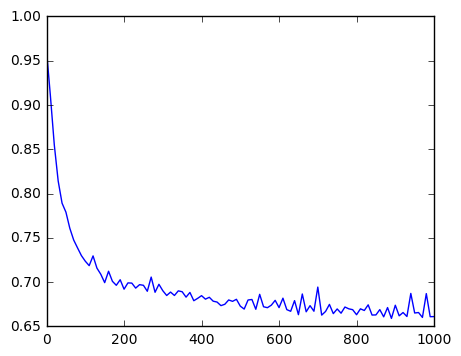

In [9]:
x_vala,y_vala = gen_batch(s_m,s_v,10)

costs = []
iterations = [0]

c = sess.run(model.cost,feed_dict = {X_in: x_vala, y_in: y_vala})
costs.append(c)

num_batches = 1000
for i in range(num_batches):
    x,y = gen_batch(s_m,s_v,10)
    sess.run(model.optimizer,feed_dict = {X_in: x, y_in: y})
    if (i+1) % 10 == 0:
        c = sess.run(model.cost,feed_dict = {X_in: x_vala, y_in: y_vala})
        costs.append(c)
        iterations.append(i+1)
        IPython.display.clear_output(wait=True)
        plt.plot(iterations,costs)
        plt.show()

### Function for getting the full mask for a signal

In [10]:
def get_full_mask(s):
    num_chips = s.shape[0]//T

    inputs = np.zeros((1,F,T,1))
    full_mask = np.zeros((num_chips*T,s.shape[1]))

    loc = 0
    for i in range(num_chips):
        chip = get_chip(s,loc)
        inputs[0] = chip
        mask = sess.run(model.get_mask, feed_dict={X_in: inputs})[0]
        mask = mask.T[0]
        full_mask[loc:loc+T,0:F] = mask
        loc += T

    return full_mask

### Get the mask for the sample input

In [11]:
mask = get_full_mask(s_m)

### View a section of the computed mask

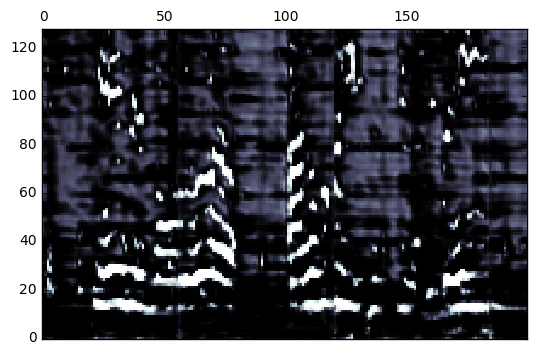

In [12]:
plt.matshow(mask.T[0:F,200:400],cmap='bone',origin='lower',vmin=0,vmax=1)
plt.show()

### Compare to the target signal

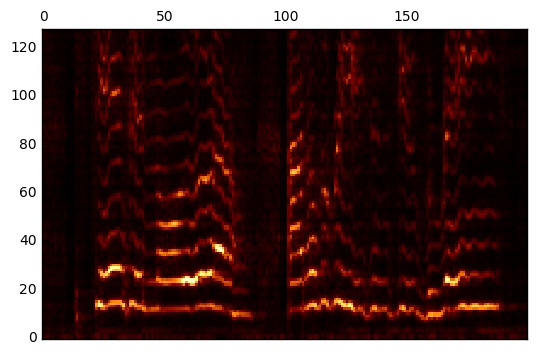

In [13]:
plt.matshow(pow(s_v,1/squashing).T[0:128,200:400],cmap='afmhot',origin='lower')
plt.show()

### The original signal

In [14]:
Audio(raw_signal[:,0],rate=sample_rate)

### The computed vocal track

In [15]:
r_s = s_m[0:mask.shape[0],:]*(mask)
X_v = r_s*np.exp(p_m[0:r_s.shape[0],:]*1.0j)
duration = int(1/2*(X_v.shape[0]+1)*window_size)

reconstructed = istft(X_v,sample_rate,duration,overlap,two_sided=False)

r_l = reconstructed.shape[0]
Audio(reconstructed,rate=sample_rate)

In [16]:
evals = bss_eval_sources(vocal_signal[0:r_l,0].T,reconstructed)
print("SDR:",evals[0])
print("SAR:",evals[2])

SDR: [ 6.67332521]
SAR: [ 6.67332521]
